In [1]:
from IPython.display import Image
import numpy as np
from sklearn.manifold import TSNE
import io
import base64
from IPython.display import HTML
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import numpy
import matplotlib.pyplot as plt
import time

def draw_scatter_plot(*args, clusters=None, color=None, labels=None, title="", size=5):
    """draw_scatter_plot(data1, data2, color=["color1", "color2"], labels=["label1", "label2"])
    draw_scatter_plot(dataset, 2, color=["color1", "color2"], ...)
    draw_scatter_plot(tsne_lda, clusters=topic_num)"""
    n_of_datasets = args[-1]
    if(isinstance(n_of_datasets, int) and len(args)-1 == 1 and clusters is None):
        #podział args na n_of_datasets czesci
        dataset = to_point_list(args[0])
        jump = (len(dataset)+1) // n_of_datasets 
        data_list = [dataset[begin:begin+jump] for begin in range(0, len(dataset), jump)]  
    elif(not isinstance(n_of_datasets, int) and clusters is None):
        data_list = list(args)
        n_of_datasets = len(args)
    elif(not isinstance(n_of_datasets, int) and clusters is not None):
        n_of_datasets = len(args)
        data_list = ([c for c in args[0]])
        color = cm.rainbow(np.linspace(0, 1, np.max(clusters)+1))
        sortList = list(zip(data_list,clusters))
        def sortKey(val):
            return val[1]
        sortList.sort(key=sortKey)
        iterVal = sortList[0][1]
        data_list = []
        local_data_list = []
        for pointData in sortList:
            if(pointData[1] == iterVal):
                # 1 color
                local_data_list.append(pointData[0])
            else:
                # 2nd color
                iterVal = pointData[1]
                data_list.append(local_data_list)
                local_data_list = []
                local_data_list.append(pointData[0])
        data_list.append(local_data_list)
        data_list = np.array(data_list)
        n_of_datasets = len(data_list)
        #print("n_of_datasets", n_of_datasets)
        #print("color", len(color))
    else: 
        raise BaseException("wrong data input format, diferent input :(")
    if(color is None or len(color) != n_of_datasets):
        if(color is not None and len(color) != n_of_datasets): print("WARNING: wrong color format, overwriting")
        color = cm.rainbow(np.linspace(0, 1, n_of_datasets))
        color = [[c] for c in color]
    show_legend = True
    if(labels is None): 
        labels = [" "] * n_of_datasets
        show_legend = False
    #if(clusters is not None and labels is not None):
        
    # data_list - list of datasets; 
    dims = len(to_1dim_list(data_list[0]))
    #print(dims)
    for data in data_list:
        if(dims != len(to_1dim_list(data))): raise BaseException("wrong data format, diferent dimensions :(")
    plt.figure();
    if(dims == 3): ax = plt.subplot(111, projection='3d')
    #print(len(data_list), len(color))
    for ind, data in enumerate(data_list):
        points = to_1dim_list(data)
        if(dims == 1): 
            plt.scatter(points[0], [0]*len(points[0]), c=color[ind], s=size, label=labels[ind]);
        elif(dims == 2):
            plt.scatter(points[0], points[1], c=color[ind], s=size, label=labels[ind]);
        elif(dims == 3):
            ax.scatter3D(points[0], points[1], points[2], c=color[ind], s=size, label=labels[ind])
        else:
            raise BaseException("wrong data format :(")
        
    plt.title(title);
    if(show_legend): plt.legend();
    plt.rcParams['figure.figsize'] = [15, 10]
    plt.show();
    
    
def to_1dim_list(point_list, force = False):
  # [(x1,y1,..),(x2,y2,...),(x3,y3,..)] ==>> [[x1,x2,x3,...],[y1,y2,...],...]
    if(force): return list(zip(*point_list))
    if(isinstance(point_list[0], int)): return [point_list]
    if(len(point_list) > len(point_list[0])):
        return list(zip(*point_list))
    else:
        return point_list
    
    
def largeVis_plot(infile, labelfile, outfile, range=''):
    label = []
    for line in open(labelfile, "r"):
        label.append(line.strip())

    N = M = 0
    all_data = {}
    for i, line in enumerate(open(inputfile)):
        vec = line.strip().split(' ')
        if i == 0:
            N = int(vec[0])
            M = int(vec[1])
        elif i <= N:
            if labelfile == '':
                label.append(0)
            all_data.setdefault(label[i-1], []).append((float(vec[-2]), float(vec[-1])))

    colors = plt.cm.rainbow(numpy.linspace(0, 1, len(all_data)))

    for color, ll in zip(colors, sorted(all_data.keys())):
        x = [t[0] for t in all_data[ll]]
        y = [t[1] for t in all_data[ll]]
        plt.rcParams['figure.figsize'] = [15, 10]
        plt.plot(x, y, '.', color = color, markersize = 4)
    if range != '':
        l = abs(float(args.range))
        plt.xlim(-l, l)
        plt.ylim(-l, l)
    plt.savefig(outfile, dpi = 500)
     

# Wstęp
Dotychczas poznaliśmy metody które działają dobrze na małych lub średnich zbiorach (dajmy na to ~2000 punktów i ~4 wymiary)

Problem wizualizacji danych robi się uciążliwy, kiedy mamy zarówno bardzo dużą ilość punktów jak i wymiarów, a metody redukcji wymiarowości (PCA/kPCA, MDS, etc.) nie przynoszą spodziewanych rezultatów. Przykładowo: mamy 100 wymiarów, a po transformacji PCA do zachowania 80% informacji nadal potrzebujemy uwzględnić 90 wymiarów. Nie ma wówczas możliwości przygotowania danych tak, żeby tSNE sobie z nimi poradziło w rozsądnym czasie. W obliczu braku dostępu do zasobów obliczeniowych często taka procedura trwa dłużej niż byłoby to praktyczne. To co w tym przypadku stanowi obliczeniowe wąskie gardło to krok tworzenia grafu podobieństwa.

Dla tSNE złożoność tego kroku to O(dN^2), a dla bhSNE O(NlogN), gdzie d - liczba wymiarów

Na tę bolączkę stara się odpowiedzieć largeVis.

link do publikacji: https://arxiv.org/pdf/1602.00370.pdf <br>
dyskusja na Hacker News: https://news.ycombinator.com/item?id=11656133

## Dwa problemy składowe: konstrukcja grafu KNN oraz wizualizacja (redukcja do 2D lub 3D)

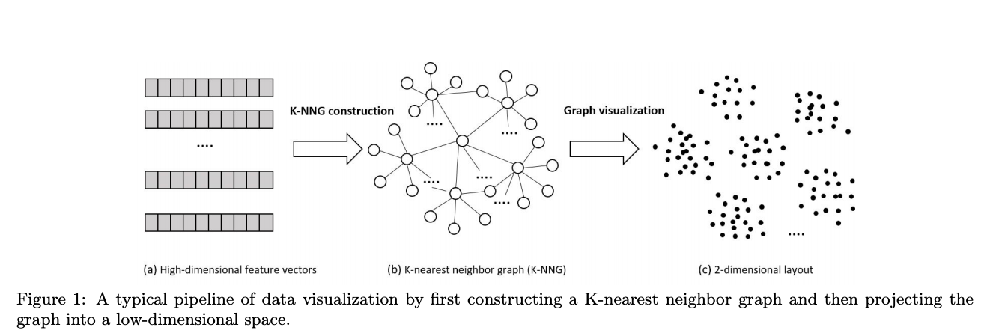

In [87]:
Image("./img/knn_typical.png")

### Krok 1: Kontrukcja grafu KNN
Podstawowy mechanizm: tworzenie grafu podobieństwa między punktami<br>
Problem: złożoność obliczeniowa tego kroku (właśnie z tego powodu tSNE nie skaluje się dobrze do np miliona punktów z setkami wymiarów)<br><br>
Bechmarki dla różnych metod kNN: https://github.com/erikbern/ann-benchmarks

### Krok 2: Wizualizacja grafu
Redukcja wymiarowości otrzymanego grafu kNN do 2 albo 3<br>
Dwa podstawowe podejścia: transforamcje liniowe (np. PCA) oraz nieliniowe (np. MDS)<br>
Metody nieliniowe lepsze od liniowych, ale 1. złożonosć i 2. słabo sobie radzą z prawdziwymi (==niespreparowanymi) danymi

Metoda nieliniowa która dobrze działa na realnych danych: tSNE. Jest ona jednak słabo skalowalna, ponadto jest wrażliwa na zmianę parametrów. Przy optymalizacjach da się podnieść wydajność kroku konstrukcji KNN w tSNE do O(NlogN)

## Technika używana przez largeVis: random projection trees + neighbourhood exploring
Opiera się głównie na założeniu "the neighbour of my neighbour is also likely to be my neighbour"<br>
Buduje się kilka random projection trees żeby zbudować przybliżony graf KNN. Na tym etapie jego dokładność najczęściej jest niewielka.<br>
Następnie staramy się ulepszyć dokładność tego grafu:<br>
Dla każdgo wierzchołka w grafie przeszukujemy sąsiadów jego sąsiadów. Można ten krok powtórzyć w kilku iteracjach żeby zwiększyć dokładność.<br>
Siła podejścia polega na tym że potrzeba tylko kilku iteracji aby dokładność grafu zbliżyła się do 100%.

Mając już graf kNN, trzeba go zwizualizować. Bez wchodzenia w szczegóły dokonuje się tego za pomocą funkcji probalistycznej, która jest optymalizowana przy pomocy stochastic gradient descent. Dzięki temu udaje się zejść ze złożonością tego kroku do O(N).

Więcej o random projection trees: https://www.youtube.com/watch?v=V9zl09w1SGM

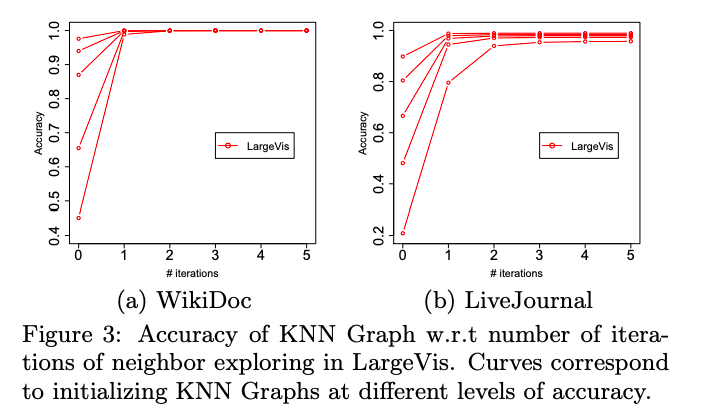

In [99]:
Image("./img/knn_graph_iterations.png")

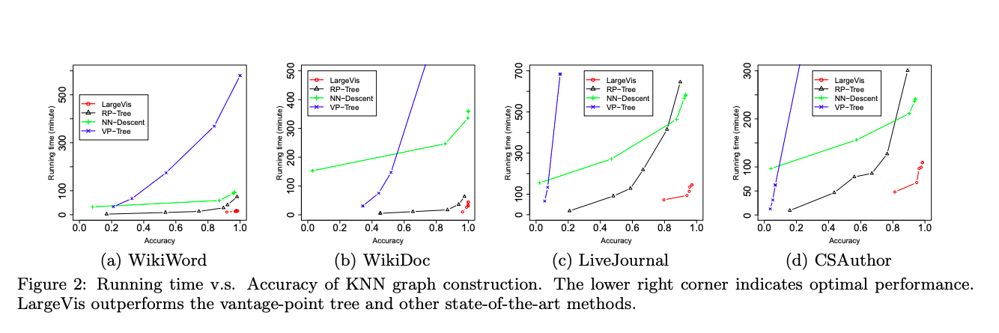

In [100]:
# Konstrukcja grafu kNN
Image("./img/knn_graph_construction_times.png")

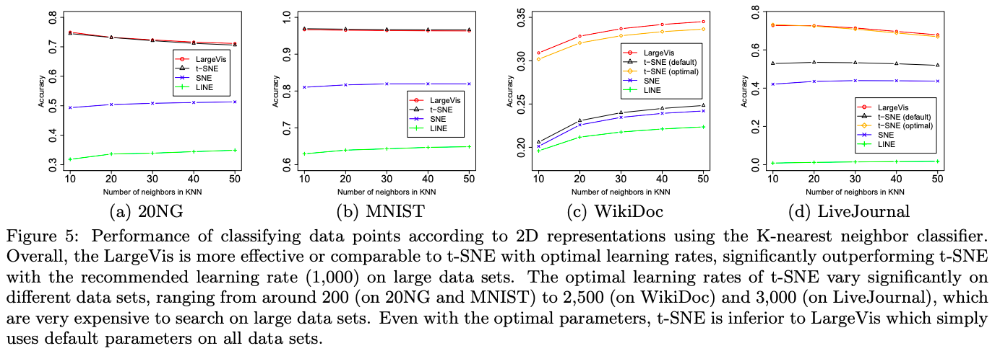

In [101]:
# klasyfikacja punktów 2D
Image("./img/graph_visualization.png")

In [21]:
video = io.open('./img/mnist.mov', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))

### LargeVis łatwo skaluje się do wielu milionów punktów o setkach wymiarów - poniższy rezultat osiągnięto przetwarzając oryginalny zbiór MNIST (70k punktów, 784 wymiarów) na procesorze dwurdzeniowym w <font color='red'>25 minut</font>

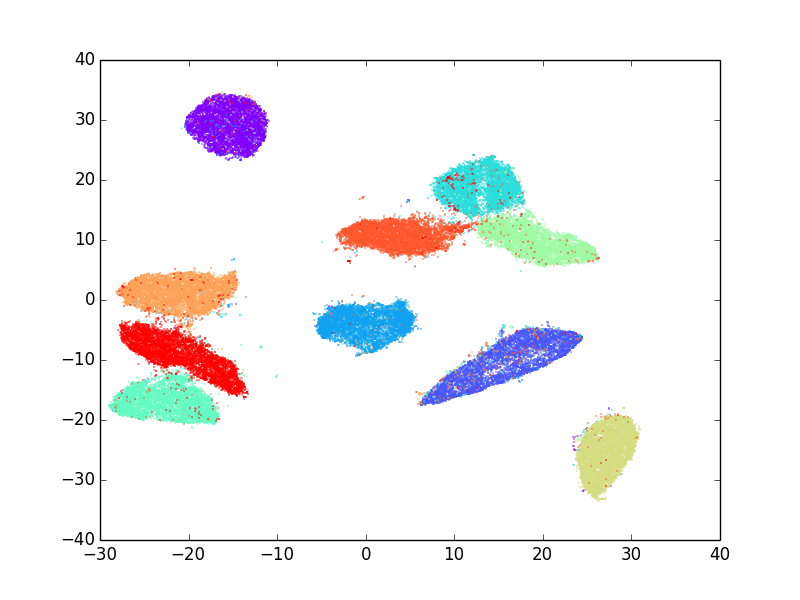

In [84]:
Image("./img/mnist_plot.png")

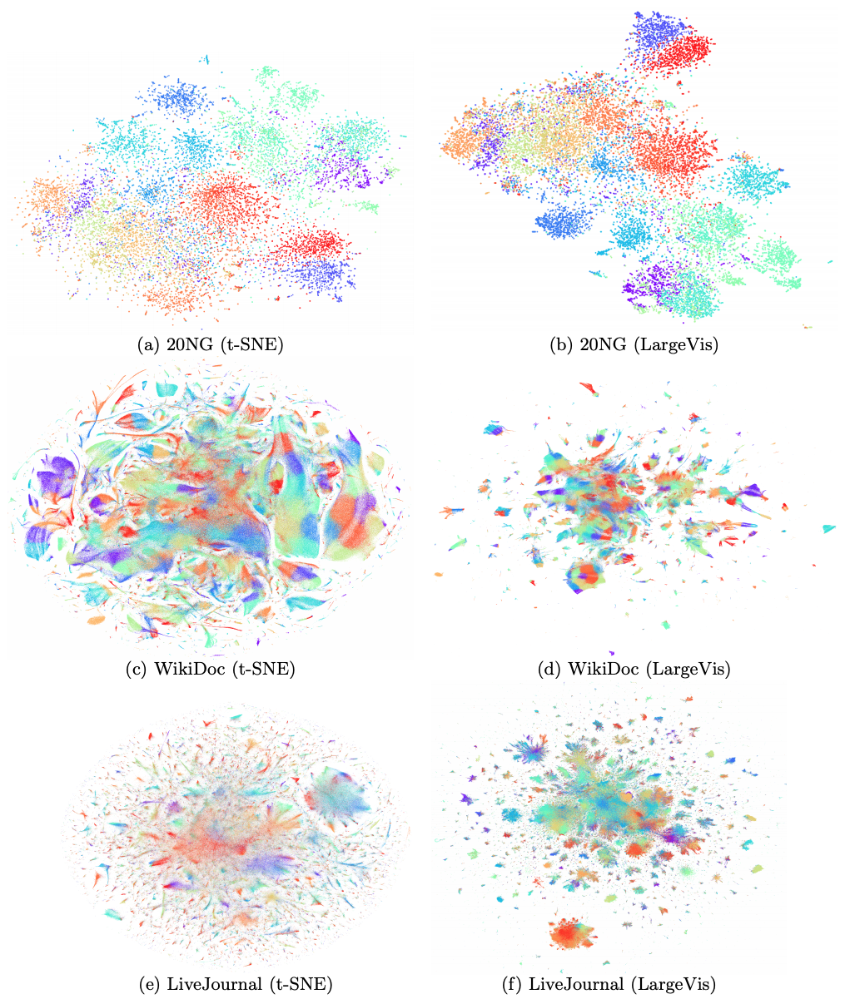

In [102]:
Image("./img/examples1.png")

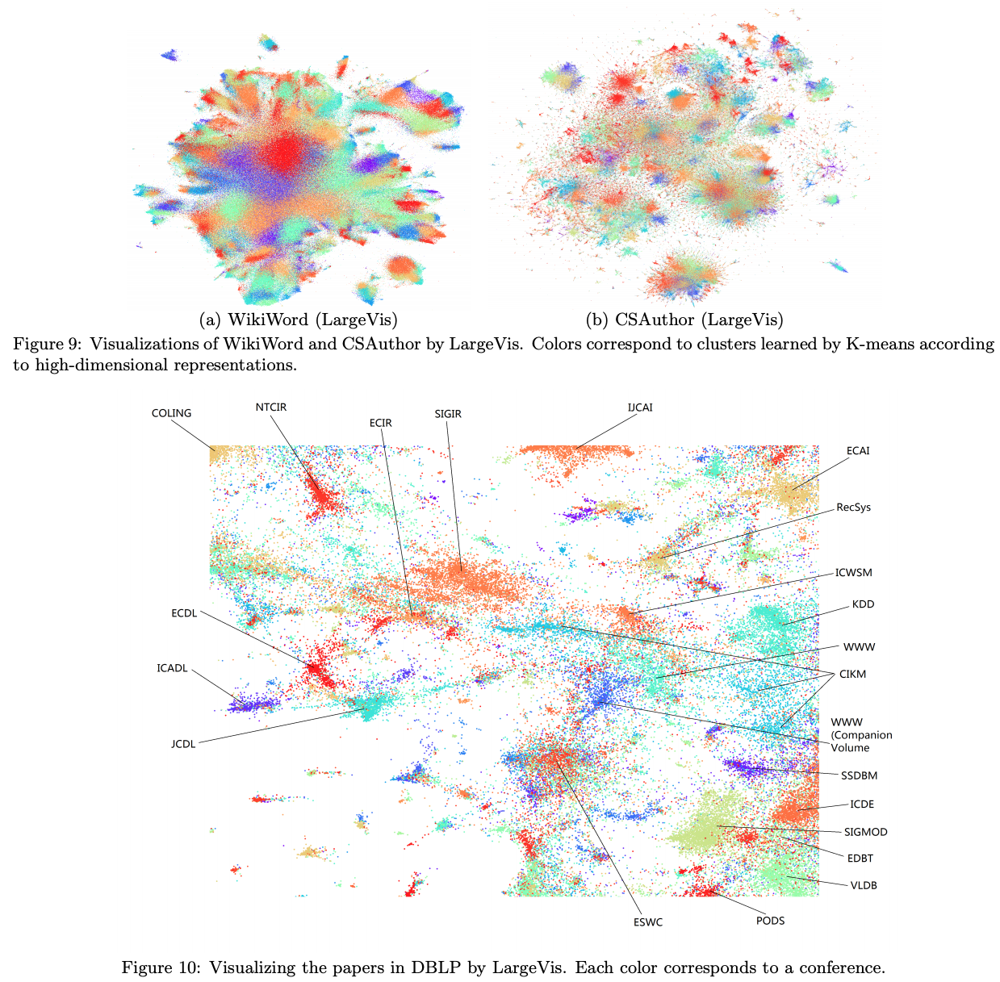

In [103]:
Image("./img/examples2.png")

# Porównanie czasów działania largeVis z tSNE oraz bhSNE

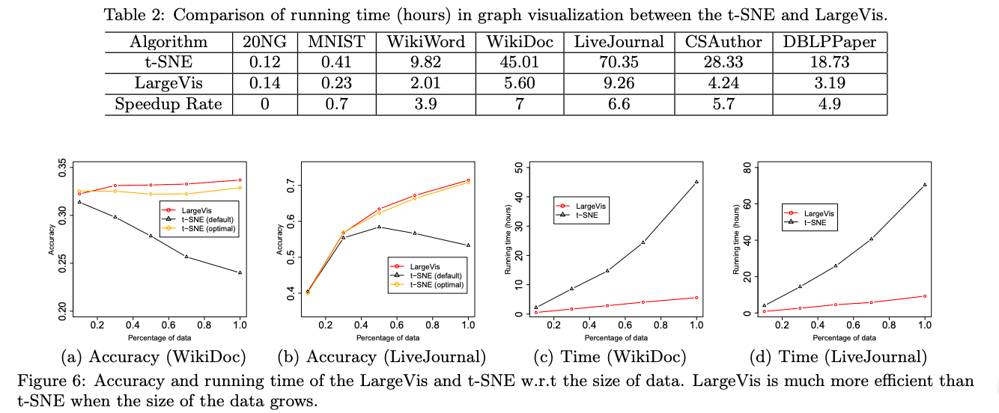

In [93]:
Image("./img/lv_vs_tsne.png")

In [128]:
# Działanie largeVis dla podbzioru 10000 puntków z MNIST
# Sprawa załatwiona w 1,5 minutki

!python prepare_subset.py   \
-i "mnist_vec784D_with_labels.txt"    \
-o "mnist_10000_784.txt"      \
-numpoints 10000            \
-numdims 784                  \
-digits 3 1 4 

In [129]:
start = time.time()
!python2 LargeVis_run.py -input mnist_10000_784.txt -output mnist_10000_784_2D_test.txt -samples 90
end = time.time()

print("The operation took: ")
print((end - start)/60)

LargeVis successfully imported!
Reading input file mnist_10000_784.txt ...... Done.
Total vertices : 10000	Dimension : 784
Normalizing ...... Done.
Running ANNOY ...... Done.
Running propagation 3/3
Test knn accuracy : 99.99%
Computing similarities ...... Done.
Fitting model	Alpha: 0.000789 Progress: 99.921%
The operation took: 
1.4352587024370829


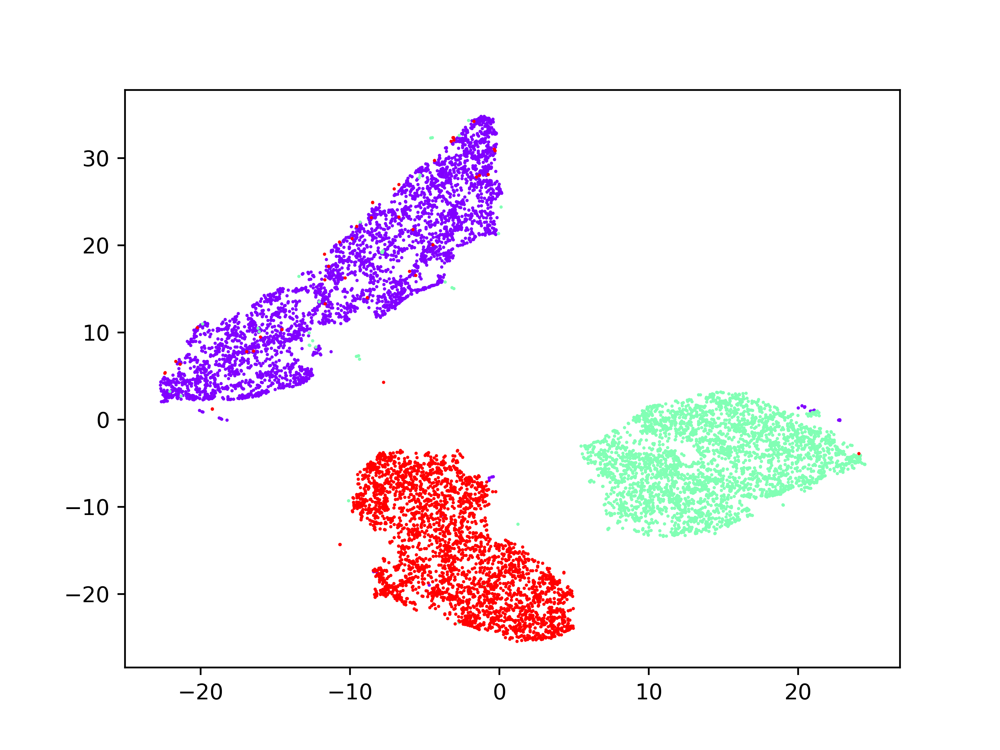

In [130]:
!python plot.py -input mnist_10000_784_2D_test.txt -label labels_mnist_10000_784.txt -output plot_10000
Image("plot_10000.png")

In [ ]:
# Poniżej: tSNE oraz bhSNE

In [62]:
infile = open("mnist_10000_784.txt", "r")
lines = infile.readlines()
final = []
for line in lines[1:]:
    line = line.split(' ')
    line[-1] = line[-1].strip()
    for i, item in enumerate(line):
        line[i] = float(item)
    final.append(line)
infile.close()
    
#tSNE:
print("tSNE - exact:")
X = np.array(final)
tsne_model = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300, method='exact')
start = time.time()
X_embedded_exact = tsne_model.fit_transform(X)
end = time.time()
print( (end - start)/60 )
#procesor dwurdzeniowy -  43,5 (!) minut dla  10k punktów 


#bhSNE:
print("Barnes-Hut:")
bh_sne_model = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300, method='barnes_hut')
start = time.time()
X_embedded_bh = bh_sne_model.fit_transform(X)
end = time.time()
print( (end - start)/60 )
#procesor dwurdzeniowy -   ~4,5 minuty dla 10k punktów

tSNE - exact:
[t-SNE] Computing pairwise distances...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 303.137770
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.441518
[t-SNE] Error after 300 iterations: 2.739562
43.541465250651044
Barnes-Hut:
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.690s...
[t-S

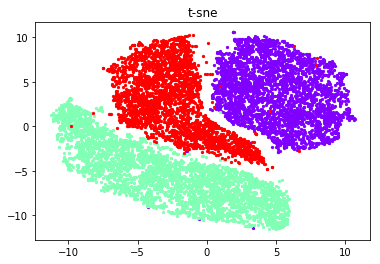

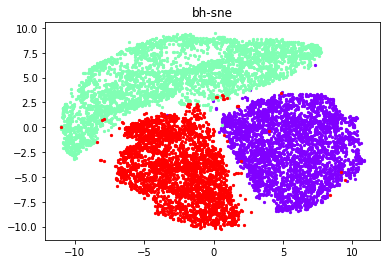

In [76]:
# Wizualizacja:
labelfile = open("labels_mnist_10000_784.txt", "r")
lines = labelfile.readlines()
final = []
for line in lines:
    line = line[:-1]
    line = int(line)
    final.append(line)
labelfile.close()

draw_scatter_plot(X_embedded_exact, clusters=final, title="t-sne")
draw_scatter_plot(X_embedded_bh, clusters=final, title="bh-sne")

# Działanie metody largeVis ze względu na kluczowe parametry, <br> w szczególności k

Metoda relatywnie stabilna ze wzgledu na dobór parametrów, w odróżnieniu od tSNE, gdzie wyczucie do tego jak dobrać parametry jest decydujące o sukcesie.<br>
Dużym utrudnieniem przy korzystaniu z tSNE jest to że dla dużych zbiorów ustalenie optymalnych parametrów może zająć bardzo dużo czasu, nie mówiąc nic o ich werfikacji.

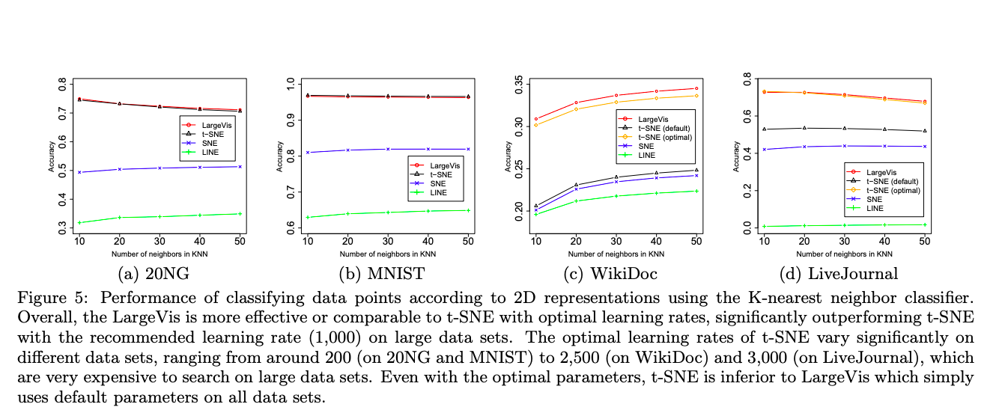

In [95]:
Image("./img/stability.png")

## Podsumowanie
Ogólnie: largeVis będzie zawsze działał szybciej i jeśli wierzyć autorom - tak samo dobrze albo lepiej.

**Zaleca się jednak korzystanie z tSNE/bhSNE lub innych dobrze znanych metod wszędzie tam gdzie to możliwe.** Głównym powodem jest bogactwo dostępnych materiałów i fakt że metodody te są starsze i "sprawdzone w boju"

**Kiedy używać largeVis?** Kiedy dane naprawdę nie chcą się dać uprościć, a do tego mamy miliony punktów o setkach wymiarów.

Dla zbiorów powyżej 10000 punktów tSNE staje się bardzo wolne, a bhSNE znajduje się w okolicach dopuszczalności.<br> Powyżej tej granicy tSNE na zwykłym komputrze jest raczej mało przydatna.

## Zadanie 1 - FMNIST
W tym zadaniu będziemy pracować z podzbiorem zbioru FMNIST. Zbiór MNIST uznaje się za łatwy, więc aby sprawę nieco utrudnić stworzono zbiór FMNIST, czyli Fashion MNIST. To kolekcja zdjęć ubrań w takim samym formacie jak MNIST.<br>
Więcej tutaj: https://github.com/zalandoresearch/fashion-mnist

Będziemy korzystać z wszystkich 784 wymiarów i wykonamy obliczenia dla 5000 punktów.

Poniżej przygotowane są trzy okna, każda odpowiadająca wywołaniu metody largeVis ze względu na określone parametry:
    1. przy parametrach domyślnych i zmianie samples
    2. przy zmianie parametru k
    3. przy zmianie parametru perplexity

Należy wykonać wizualizację dla każdej z nich dla zadanego zbioru MNIST, a w sprawozdaniu zawrzeć wnioski. 

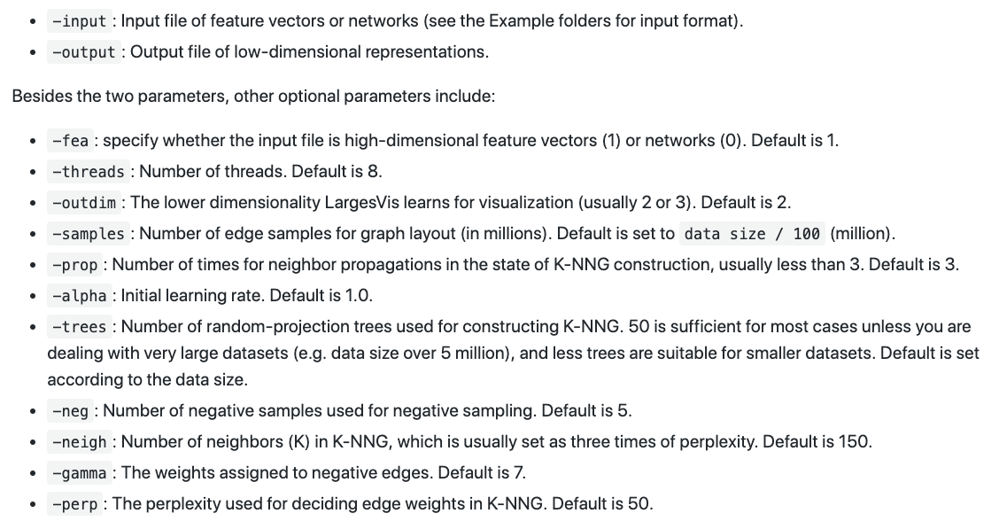

In [226]:
from IPython.display import Image
Image("./img/sciaga.png")

In [409]:
# Przygotowanie pliku .csv do postaci akceptowanej przez largeVis

infile = open("zalando_in_all.csv", "r")
outfile = open("fmnist_70k_784_largevis_with_labels.txt", "w+")
labelfile = open("labels_fmnist_70k_784.txt", "w+")

num_points = 70000
num_dims = 784

outfile.write(str(num_points) + " " + str(num_dims) + "\n")
lines = infile.readlines()
for line in lines:
    label = line[-3:]
    digit = label.strip()[1:]
    digit_int = int(digit, 10)

    txt = line.split(',')
    fin = " ".join(txt)

    outfile.write(fin)
    labelfile.write(digit + "\n")

infile.close()
outfile.close()
labelfile.close()

In [464]:
# Przygotowanie podzbioru
# Zestawy:
# Grupa 1: 0 1 5
# Grupa 2: 2 9 1
# Grupa 3: 9 0 1
# Grupa 4: 8 4 1
# Grupa 5: 7 1 0

input_file = "fmnist_70k_784_largevis_with_labels.txt" 
output_file = "fmnist_5000_784.txt" 
num_points = 5000
num_dims = 784

# Tutaj wpisujemy nasze kategorie:
categories = [7, 1, 0]


infile = open(input_file, "r")
outfile = open(output_file, "w+")
label_file = "labels_" + output_file
labelfile = open(label_file, "w+")

counter = 0
outfile.write(str(num_points) + " " + str(num_dims))

lines = infile.readlines()
for line in lines[1:]:
    label = line[-3:]
    digit = label.strip()
    digit_int = int(digit, 10)

    txt = line.split(' ')[:num_dims]
    fin = "\n" + " ".join(txt)

    if(digit_int in categories):
        counter = counter+1
        outfile.write(fin)
        labelfile.write(digit + "\n")
        if (counter == num_points):
            break
            
infile.close()
outfile.close()
labelfile.close()

In [474]:
# Pierwsze przejście: zmieniamy wartość samples
# Parametr sample ma kluczowe znaczenie w kroku konwersji grafu kNN do 2D
# wartość domyślna parametru samples to <rozmiar danych>/100 * 1000000

# Spróbować kolejno dla: 1, 5, 25, 35, 50, może więcej być potrzebne
# dla 35 i 50 uruchomić 2-3 razy
# Rozważyć otrzymywane wyniki w kontekście tego, że algorytm działa w sposób probabilistyczny

# Pytanie: jaka wartość samples wydaje się stabilna dla 5000 punktów?
# Co się dzieje z danymi? Jak to się ma do czasu wykonania?

# Na razie dwa inne kluczowe parametry pozostawiamy przy wartościach domyślnych:
# perplexity = 50
# neigh = 150 

#Wnioski: ile sampli potrzebujemy

start = time.time()
!python2 LargeVis_run.py -input fmnist_5000_784.txt -output fmnist_5000_784_2D_1.txt -samples 50
end = time.time()

print("The operation took: ")
print((end - start)/60)

In [467]:
#Wizualizacja 1
#largeVis_plot(infile="fmnist_5000_784_2D_1.txt", labelfile="labels_fmnist_5000_784.txt", outfile="zad1_plot_1")

!python plot.py -input fmnist_5000_784_2D_1.txt -label labels_fmnist_5000_784.txt -output zad1_plot_1
Image("zad1_plot_1.png")

In [468]:
# Porównanie z tSNE oraz bhSNE
# Na zajęciach: tylko bh-SNE (szkoda czasu na tSNE)

import numpy as np
from sklearn.manifold import TSNE
import time

infile = open("fmnist_5000_784.txt", "r")
lines = infile.readlines()
final = []
for line in lines[1:]:
    line = line.split(' ')
    line[-1] = line[-1].strip()
    for i, item in enumerate(line):
        line[i] = float(item)
    final.append(line)
infile.close()

#tSNE:
#print("tSNE - exact:")
#X = np.array(final)
#tsne_model = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300, method='exact')
#start = time.time()
#X_embedded_exact = tsne_model.fit_transform(X)
#end = time.time()
#print( (end - start)/60 )


#bhSNE:
print("Barnes-Hut:")
X = np.array(final)
bh_sne_model = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300, method='barnes_hut')
start = time.time()
X_embedded_bh = bh_sne_model.fit_transform(X)
end = time.time()
print( (end - start)/60 )

In [469]:
# Wizualizacja tSNE oraz bhSNE:
labelfile = open("labels_fmnist_5000_784.txt", "r")
lines = labelfile.readlines()
labels = []
for line in lines:
    line = int(line[:-1])
    labels.append(line)
labelfile.close()

#draw_scatter_plot(X_embedded_exact, clusters=labels, title="t-sne")
draw_scatter_plot(X_embedded_bh, clusters=labels, title="bh-sne")

In [ ]:
# Wnioski: jak sobie radzi niezoptymalizowany tSNE i bhSNE w porównaniu do largeVis jeżeli chodzi o:
# - czas wykonania
# - uzyskaną separację danych

# largeVis lepszy czy gorszy? 

In [470]:
# Drugie przejście: sample na ok. 50 (lub tyle ile uznaliście że jest dobrze),
# pytanie ile sąsiadów potrzebujemy żeby mieć cały czas dobrą separację?

# Poeksperymentujcie z przełącznikiem -neigh (czyli k w konstrukcji grafu kNN)
# Spróbować dla k = 1, 50, 150, 300, 500, a może więcej
# Ile sąsiadów potrzebujemy wziąć aby utrzymywać dobrą separację danych? Jak to wpływa na wydajność?
# Czy więcej sąsiadów zawsze oznacza lepszy wynik?

# perplexity = 50
# samples = ~50
# neigh = ?

# Wnioski: czy mozna uznać że metoda jest stabilna ze względu na k 
# (==czy mamy jakieś korzyści ze zwiększania tego parametru powyżej pewnego progu, 
# czy wydaje się że jest pewień optymalny pułap)?


start = time.time()
!python2 LargeVis_run.py -input fmnist_5000_784.txt -output fmnist_5000_784_2D_2.txt -samples 50 -neigh 500
end = time.time()

print("The operation took: ")
print((end - start)/60)

In [471]:
#Wizualizacja 2
#largeVis_plot(infile="fmnist_5000_784_2D_2.txt", labelfile="labels_fmnist_5000_784.txt", outfile="zad1_plot_2")

!python plot.py -input fmnist_5000_784_2D_2.txt -label labels_fmnist_5000_784.txt -output zad1_plot_2
Image("zad1_plot_2.png")

In [ ]:
# Czy szybka metoda wizualizacj coś znaczy, jeśli mamy kiepski graf?

# Wnioski co do stabilności metody (czas wykonania, seperacja danych) 
# ze względu na k (w punkcie pierwszym wartość domyślna - 150 sąsiadów, w drugim - od 1 do nawet 500 i więcej):




In [472]:
# Trzecie przejście: manipulacja parametrem perplexity
# k domyślne: 150
# Sprawdzamy dla perp = 5, 30, 50, 100, 150, 300
 
# k zostawiamy na wartości domyslne (150) i zmieniamy perplexity
# parametr perplexity jest powiązany z parametrem k
# Pytanie: czy większe perplexity zawsze wiąże się z lepszym wynikiem?

# Dla chętnych: sprawdzić dla różnych kombinacji k oraz perp


# samples = 50
# neigh = 150
# perp = ?

start = time.time()
!python2 LargeVis_run.py -input fmnist_5000_784.txt -output fmnist_5000_784_2D_3.txt -samples 50 -perp 300
end = time.time()

print("The operation took: ")
print((end - start)/60)

In [473]:
#Wizualizacja 3
#largeVis_plot(infile="fmnist_5000_784_2D_3.txt", labelfile="labels_fmnist_5000_784.txt", outfile="zad1_plot_3")

!python plot.py -input fmnist_5000_784_2D_3.txt -label labels_fmnist_5000_784.txt -output zad1_plot_3
Image("zad1_plot_3.png")

In [ ]:
# Wnioski co do stabilności metody (czas wykonania, seperacja danych, optymalna wartość) 
# względem parametru perplexity przy domyślnej wartości k = 150 






Tabela dla podzbioru FMNIST:

|Metoda\Czas | largevis | tSNE | bhSNE
| --- | --- | --- | --- | --- |
| tSNE |  |  |  | 
| bhSNE |  |  |  |
| largeVis |  |  | |

W sprawozdaniu oprócz wniosków dotyczących czasu zawrzeć wnioski odnośnie manipulacji parametrami, w szczególności k oraz perplexity, a także kiedy stosować largeVis a kiedy inne metody.

## BONUS:<br>Sprawdzenie ile czasu zajmie przetworzenie *całego i oryginalnego* zbioru MNIST (70000 punktów, 784 wymiarów) przy domyślnych parametrach largeVis na swoim komputerze PC

Poniżej gotowe komendy do przeklejenia, pliki dostępne na stronie oficjalnej implementacji: https://github.com/lferry007/LargeVis

In [ ]:
python2 LargeVis_run.py -input mnist_vec784D.txt -output mnist_vec2D.txt -threads 16
python2 plot.py -input mnist_vec2D.txt -label mnist_label.txt -output mnist_vec2D_plot

## Zadanie 2
To samo albo coś podobnego tylko dla 20NewsGroups